### Library Imports

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re
from wordcloud import WordCloud

Mounted at /content/drive


In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Conv1D, MaxPool1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

### Exploring Fake News

In [ ]:
fake = pd.read_csv('/content/drive/MyDrive/Data/Fake.csv')

In [ ]:
fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [ ]:
fake.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [ ]:
fake['subject'].value_counts()

News               9050
politics           6841
left-news          4459
Government News    1570
US_News             783
Middle-east         778
Name: subject, dtype: int64

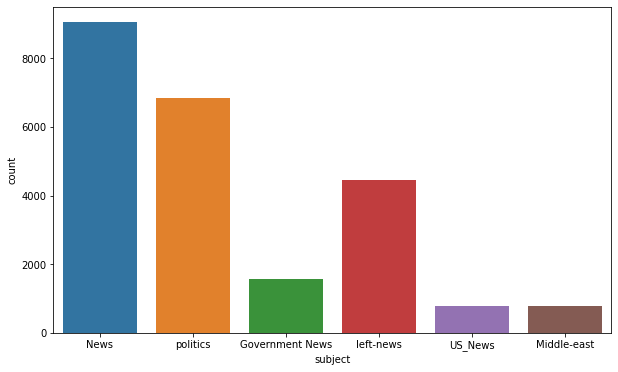

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x = 'subject',data=fake)

### Word Cloud

In [ ]:
text = ' '.join(fake['text'].tolist())

In [ ]:
' '.join(['this','is','a','data'])

'this is a data'

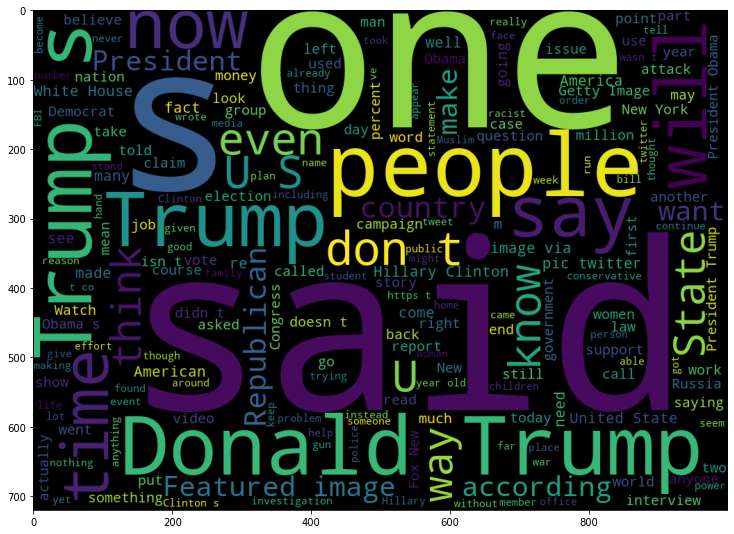

In [ ]:
wordcloud = WordCloud(width=1000, height=720).generate(text)
fig = plt.figure(figsize=(10,10))
plt.imshow(wordcloud)
plt.tight_layout(pad=0)
plt.show()

### Exploring Real News

In [ ]:
real = pd.read_csv('/content/drive/MyDrive/Data/True.csv')

In [ ]:
text = ' '.join(real['text'].tolist())

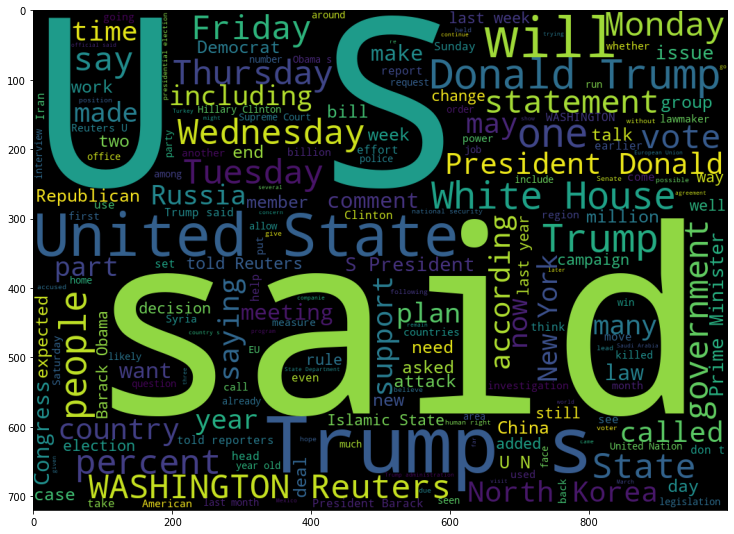

In [ ]:
wordcloud = WordCloud(width=1000, height=720).generate(text)
fig = plt.figure(figsize=(10,10))
plt.imshow(wordcloud)
plt.tight_layout(pad=0)
plt.show()

## Cleaning Data

Remove Reuters or Twitter Tweet information from the text



*   Text can be splitted only once at "-" which is always present after mentioning source of publication, this gives us publication part and text part.
*   If we do not get text part, this means publication deatils wasn't given for that record


*   The Twitter tweets always have same source, a long text of max 259 characters








In [ ]:
real.sample(5)

,title,text,subject,date
10705,N.C. city's vote to expand transgender rights ...,(Reuters) - A top North Carolina lawmaker vowe...,politicsNews,"February 23, 2016"
8259,Clinton rejects Mexico invitation after Trump'...,(Reuters) - U.S. Democratic presidential candi...,politicsNews,"September 6, 2016"
13098,Spain makes largest cocaine bust in 18 years,MADRID (Reuters) - Spain has made its largest ...,worldnews,"December 5, 2017"
20779,Australia's High Court rejects challenge to vo...,Melbourne (Reuters) - Australia s High Court r...,worldnews,"September 7, 2017"
3461,Treasury chief 'confident' Congress will raise...,WASHINGTON (Reuters) - U.S. Treasury Secretary...,politicsNews,"June 1, 2017"


In [ ]:
unknown_publishers = []
for index, row in enumerate(real.text.values):
  try:
    record = row.split('-', maxsplit=1)
    record[1]
    assert(len(record[0])<120)
  except:
    unknown_publishers.append(index)

In [ ]:
len(unknown_publishers)

222

In [ ]:
real.iloc[unknown_publishers].text

7        The following statements were posted to the ve...
8        The following statements were posted to the ve...
12       The following statements were posted to the ve...
13       The following statements were posted to the ve...
14        (In Dec. 25 story, in second paragraph, corre...
                               ...                        
20135     (Story corrects to million from billion in pa...
20500     (This Sept 8 story corrects headline, clarifi...
20667     (Story refiles to add dropped word  not , in ...
21246     (Story corrects third paragraph to show Mosul...
21339     (Story corrects to fix spelling in paragraph ...
Name: text, Length: 222, dtype: object

In [ ]:
real.iloc[8970]

title      Graphic: Supreme Court roundup
text                                     
subject                      politicsNews
date                       June 16, 2016 
Name: 8970, dtype: object

In [ ]:
#real = real.drop(8970, axis=0)

In [ ]:
publisher = []
tmp_text = []

for index, row in enumerate(real.text.values):
  if index in unknown_publishers:
    tmp_text.append(row)
    publisher.append('Unknown')

  else:
    record = row.split('-',maxsplit=1)
    publisher.append(record[0])
    tmp_text.append(record[1])

In [ ]:
real['publisher'] = publisher
real['text'] = tmp_text

In [ ]:
real.head()

,title,text,subject,date,publisher
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fi...,politicsNews,"December 29, 2017",WASHINGTON (Reuters)
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links be...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos to...,politicsNews,"December 30, 2017",WASHINGTON (Reuters)
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Pos...,politicsNews,"December 29, 2017",SEATTLE/WASHINGTON (Reuters)


In [ ]:
real.shape

(21417, 5)

In [ ]:
empty_fake_index = [index for index,text in enumerate(fake.text.tolist()) if str(text).strip()==""]

In [ ]:
fake.iloc[empty_fake_index]

,title,text,subject,date
10923,TAKE OUR POLL: Who Do You Think President Trum...,,politics,"May 10, 2017"
11041,Joe Scarborough BERATES Mika Brzezinski Over “...,,politics,"Apr 26, 2017"
11190,WATCH TUCKER CARLSON Scorch Sanctuary City May...,,politics,"Apr 6, 2017"
11225,MAYOR OF SANCTUARY CITY: Trump Trying To Make ...,,politics,"Apr 2, 2017"
11236,SHOCKER: Public School Turns Computer Lab Into...,,politics,"Apr 1, 2017"
...,...,...,...,...
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"


In [ ]:
real['text'] = real['text']+ " " + real['text']
fake['text'] = fake['text']+ " " + fake['text']

In [ ]:
real['text'] = real['text'].apply(lambda x: str(x).lower())
fake['text'] = fake['text'].apply(lambda x: str(x).lower())

## Preprocessing Text

In [ ]:
real['class'] = 1
fake['class'] = 0

In [ ]:
real.columns

Index(['title', 'text', 'subject', 'date', 'publisher', 'class'], dtype='object')

In [ ]:
real = real[['text', 'class']]
fake = fake[['text', 'class']]


In [ ]:
data = real.append(fake, ignore_index=True)

In [ ]:
data.sample(5)

,text,class
4171,the trump administration and the cuban govern...,1
18562,the catalan government said around 2.26 milli...,1
293,the u.s. senate voted on wednesday to go to a...,1
25949,world-renowned writer/director joss whedon has...,0
24092,we hear a lot from republicans about how they ...,0


In [ ]:
!pip install spacy==2.2.3
!python -m spacy download en_core_web_sm
!pip install beautifulsoup4==4.9.1
!pip install textblob==0.15.3

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 10.4 MB 4.2 MB/s 
     |████████████████████████████████| 3.7 MB 37.1 MB/s 
     |████████████████████████████████| 2.2 MB 40.7 MB/s 
     |████████████████████████████████| 184 kB 56.4 MB/s 
  Attempting uninstall: srsly
    Found existing installation: srsly 2.4.4
    Uninstalling srsly-2.4.4:
      Successfully uninstalled srsly-2.4.4
  Attempting uninstall: blis
    Found existing installation: blis 0.7.8
    Uninstalling blis-0.7.8:
      Successfully uninstalled blis-0.7.8
  Attempting uninstall: thinc
    Found existing installation: thinc 8.1.0
    Uninstalling thinc-8.1.0:
      Successfully uninstalled thinc-8.1.0
  Attempting uninstall: catalogue
    Found existing installation: catalogue 2.0.8
    Uninstalling catalogue-2.0.8:
      Successfully uninstalled catalogue-2.0.8
  Attempting uninstall: spacy
    Found existing installation: sp

In [ ]:
pip install git+https://github.com/laxmimerit/preprocess_kgptalkie.git --upgrade --force-reinstall

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/laxmimerit/preprocess_kgptalkie.git to /tmp/pip-req-build-854kjtlx
  Running command git clone -q https://github.com/laxmimerit/preprocess_kgptalkie.git /tmp/pip-req-build-854kjtlx
  Created wheel for preprocess-kgptalkie: filename=preprocess_kgptalkie-0.1.3-py3-none-any.whl size=11756 sha256=5dcad7e2a287acec79ffd1503dace57f6ca806afccad973813302139ff57deac
  Stored in directory: /tmp/pip-ephem-wheel-cache-uvs2apmb/wheels/0d/b3/29/bfe3deffda68980088d17b81331be6667e837ffb4a071bae82
Successfully built preprocess-kgptalkie


In [ ]:
import preprocess_kgptalkie as ps

In [ ]:
data['text'] = data['text'].apply(lambda x: ps.remove_special_chars(x))

In [ ]:
ps.remove_special_chars('this , . @ is gre@t')

'this is gret'

In [ ]:
data.head()

,text,class
0,the head of a conservative republican faction ...,1
1,transgender people will be allowed for the fir...,1
2,the special counsel investigation of links bet...,1
3,trump campaign adviser george papadopoulos tol...,1
4,president donald trump called on the us postal...,1


## Vectorization = Word2Vec

In [ ]:
import gensim

In [ ]:
y = data['class'].values

In [ ]:
X = [d.split() for d in data['text'].tolist()]

In [ ]:
type(X[0])

list

In [ ]:
print(X[0])

['the', 'head', 'of', 'a', 'conservative', 'republican', 'faction', 'in', 'the', 'us', 'congress', 'who', 'voted', 'this', 'month', 'for', 'a', 'huge', 'expansion', 'of', 'the', 'national', 'debt', 'to', 'pay', 'for', 'tax', 'cuts', 'called', 'himself', 'a', 'fiscal', 'conservative', 'on', 'sunday', 'and', 'urged', 'budget', 'restraint', 'in', '2018', 'in', 'keeping', 'with', 'a', 'sharp', 'pivot', 'under', 'way', 'among', 'republicans', 'us', 'representative', 'mark', 'meadows', 'speaking', 'on', 'cbs', 'face', 'the', 'nation', 'drew', 'a', 'hard', 'line', 'on', 'federal', 'spending', 'which', 'lawmakers', 'are', 'bracing', 'to', 'do', 'battle', 'over', 'in', 'january', 'when', 'they', 'return', 'from', 'the', 'holidays', 'on', 'wednesday', 'lawmakers', 'will', 'begin', 'trying', 'to', 'pass', 'a', 'federal', 'budget', 'in', 'a', 'fight', 'likely', 'to', 'be', 'linked', 'to', 'other', 'issues', 'such', 'as', 'immigration', 'policy', 'even', 'as', 'the', 'november', 'congressional', 'e

In [ ]:
DIM = 100
w2v_model = gensim.models.Word2Vec(sentences=X, size=DIM, window=10, min_count=1)

In [ ]:
len(w2v_model.wv.vocab)

228264

In [ ]:
w2v_model.wv['india']

array([-1.66445732e+00, -1.34690595e+00,  3.37541044e-01, -4.56869888e+00,
        2.46111608e+00, -5.88306427e-01,  1.71918273e-01, -7.14776933e-01,
       -9.65055287e-01,  2.49859524e+00,  1.39093935e+00,  4.60977173e+00,
        3.14625597e+00,  2.16246977e-01,  5.19792795e-01, -1.00156510e+00,
        2.65840197e+00, -2.10507610e-03,  4.10661316e+00,  8.08999181e-01,
       -5.17045677e-01,  6.32574499e-01,  1.63628489e-01, -2.36763263e+00,
        4.14816570e+00, -6.77394629e-01,  1.63153303e+00, -1.48084438e+00,
        2.20445967e+00,  4.53873843e-01, -1.77242219e+00, -5.33019352e+00,
        1.21526666e-01, -1.60360074e+00,  1.02192366e+00, -2.68011093e+00,
       -2.80436099e-01, -3.33047748e-01,  9.06818211e-01,  3.39625716e-01,
       -1.71286356e+00, -1.13885008e-01, -2.28640842e+00,  8.08753788e-01,
        3.14307404e+00, -3.05731916e+00, -2.58790183e+00,  1.47141421e+00,
        2.05262918e-02,  1.32388151e+00, -2.00508118e+00, -1.37910888e-01,
        6.83078989e-02, -

In [ ]:
w2v_model.wv.most_similar('india')

[('pakistan', 0.701598584651947),
 ('malaysia', 0.662390947341919),
 ('china', 0.6349714994430542),
 ('indian', 0.6234363317489624),
 ('narendra', 0.6026566028594971),
 ('philippines', 0.5921923518180847),
 ('cpec', 0.5885261297225952),
 ('asia', 0.578786313533783),
 ('australia', 0.5775400400161743),
 ('indias', 0.5723981857299805)]

In [ ]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X)

In [ ]:
X = tokenizer.texts_to_sequences(X)

In [ ]:
X

[[1,
  429,
  3,
  4,
  305,
  81,
  6149,
  6,
  1,
  32,
  192,
  29,
  766,
  26,
  267,
  10,
  4,
  1199,
  2935,
  3,
  1,
  122,
  980,
  2,
  449,
  10,
  186,
  1233,
  171,
  393,
  4,
  1350,
  305,
  8,
  335,
  5,
  1075,
  490,
  7983,
  6,
  1208,
  6,
  1748,
  15,
  4,
  3318,
  7793,
  140,
  162,
  308,
  136,
  32,
  775,
  913,
  7609,
  654,
  8,
  2016,
  486,
  1,
  368,
  1715,
  4,
  553,
  590,
  8,
  167,
  694,
  49,
  416,
  28,
  16934,
  2,
  89,
  1396,
  66,
  6,
  394,
  59,
  31,
  778,
  25,
  1,
  7907,
  8,
  195,
  416,
  39,
  1421,
  350,
  2,
  914,
  4,
  167,
  490,
  6,
  4,
  502,
  301,
  2,
  22,
  1962,
  2,
  77,
  421,
  163,
  18,
  317,
  209,
  105,
  18,
  1,
  496,
  561,
  99,
  1758,
  1467,
  6,
  49,
  136,
  39,
  1127,
  2,
  378,
  353,
  3,
  192,
  37,
  67,
  16,
  5,
  19,
  136,
  182,
  4,
  400,
  490,
  938,
  6,
  172,
  694,
  110,
  206,
  61,
  182,
  12037,
  3479,
  10,
  16683,
  12735,
  694,
  8,
  972,
  

In [ ]:
#tokenizer.word_index

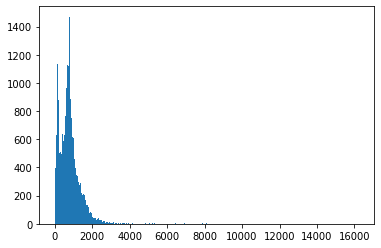

In [ ]:
plt.hist([len(x) for x in X], bins = 700)
plt.show()

In [ ]:
nos = np.array([len(x) for x in X])
len(nos[nos>1000])

11705

In [ ]:
maxlen = 1000
X = pad_sequences(X, maxlen=maxlen)

In [ ]:
len(X[101])

1000

In [ ]:
vocab_size = len(tokenizer.word_index) + 1
vocab = tokenizer.word_index

In [ ]:
def get_weight_matrix(model):
  weight_matrix = np.zeros((vocab_size, DIM))

  for word, i in vocab.items():
    weight_matrix[i] = model.wv[word]

  return weight_matrix


In [ ]:
embedding_vectors = get_weight_matrix(w2v_model)

In [ ]:
embedding_vectors.shape

## Model

In [ ]:
model = Sequential()
model.add(Embedding(vocab_size, output_dim=DIM, weights = [embedding_vectors], input_length=maxlen, trainable=False))
model.add(LSTM(units=128))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])


In [ ]:
model.summary()

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y)

In [ ]:
model.fit(X_train, y_train, batch_size = 64, validation_split=0.3, epochs=2)
#model.fit(padded_train, y_train, batch_size = 64, validation_split = 0.1, epochs = 2)

Epoch 1/2
369/369 [==============================] - 876s 2s/step - loss: 0.1473 - acc: 0.9443 - val_loss: 0.0700 - val_acc: 0.9788
Epoch 2/2
369/369 [==============================] - 869s 2s/step - loss: 0.0623 - acc: 0.9798 - val_loss: 0.0566 - val_acc: 0.9813


In [ ]:
y_pred = (model.predict(X_test) >=0.5).astype(int)

In [ ]:
accuracy_score(y_test, y_pred)

0.9816481069042317

In [ ]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.98      0.99      0.98      5862
           1       0.99      0.98      0.98      5363

    accuracy                           0.98     11225
   macro avg       0.98      0.98      0.98     11225
weighted avg       0.98      0.98      0.98     11225



In [ ]:
 x = ['this is a news']

In [ ]:
X_test

array([[    0,     0,     0, ...,   597,    12,    13],
       [    0,     0,     0, ...,  3025,   170, 14193],
       [    0,     0,     0, ..., 14519,     6,   601],
       ...,
       [29739, 39703,     3, ...,   308,    77,   339],
       [    0,     0,     0, ...,  1142,  8145,   479],
       [  814,    16,    41, ...,  2539,  5545,   479]], dtype=int32)

In [ ]:
x = ['this is a news']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)

In [ ]:
(model.predict(x) >= 0.5).astype(int)

array([[0]])

In [ ]:
x = ['Mumbai News Live Updates:  India on Monday reported 1,885 fresh COVID-19 cases, a fall of 36 per cent compared to Sunday, and a single fatality, taking the tally of infections to 79,12,462 and the death toll to 1,47,871, the state health department said. Mumbai recorded 1,118 fresh cases, about 38 per cent less compared to the previous day, as per the Brihanmumbai Municipal Corporation’s bulletin. Generally, Maharashtra reports less number of infections on Mondays, mainly due to fewer tests conducted on weekends.Meanwhile, Prime Minister Narendra Modi will visit Maharashtra on June 14 when he will inaugurate Saint Tukaram Maharaj Temple in Dehu, Pune. The PM will also inaugurate the Jal Bhushan Building and Gallery of Revolutionaries at Raj Bhawan in Mumbai. Jal Bhushan has been the official residence of the Governor of Maharashtra since 1885. Upon completing its lifespan, it was demolished and a new building was sanctioned in its place.']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >= 0.5).astype(int)

array([[1]])

In [ ]:
x = ['Madhya Pradesh Municipal Election Phase 1 Result: Madhya Pradesh Chief Minister Shivraj Singh Chouhan congratulated the winners, and thanked voters after BJP swept three municipal corporations, including Satna, Khandva and Burhanpur. Out of the remaining eight municipal corporations, BJP is ahead in four, including Bhopal, Indore, Ujjain and Sagar. Days after Delhi Chief Minister and AAP national convenor Arvind Kejriwal’s road show in Singrauli, party’s mayoral candidate Rani Agarwal is ahead in the Singrauli Municipal Corporation, followed by BJP’s Chandra Pratap Vishwakarma. In a huge setback to the ruling BJP, AAP’s candidates are also leading in 20 out of 45 wards in Singrauli’s councilor elections. Earlier in the day, Indore’s mayoral candidate Sanjay Shukla, while claiming harassment at the hands of the local police and administration, sat on dharna outside the Indore Stadium. He alleged that despite having valid passes, the Congress workers were not being allowed to enter the stadium where the counting is taking place.The counting of votes for the first phase of municipal elections in Madhya Pradesh started at 9 am on Sunday. Elections to 133 civic bodies, including 11 municipal corporations, 36 municipal councils and 86 towns councils in the first phase were held on July 6. The first phase saw a voter turnout of 61 per cent. The counting for the second phase of urban bodies elections will be held on July 20']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >= 0.5).astype(int)

array([[1]])

In [ ]:
x = ['This is a news reporter']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >= 0.5).astype(int)

array([[0]])

In [ ]:
x = ['Information and Broadcasting Minister Anurag Thakur on Saturday called for introspection by media houses of their functioning after Chief Justice of India NV Ramana said kangaroo courts by media were detrimental to the health of democracy. Speaking at the National Broadcasting Day function at All India Radio here, Mr Thakur said CJI Ramana s remarks raised questions on the credibility of the media."We need to introspect whether we have crossed the Lakshman Rekha while delivering news," Mr Thakur said. "I wish to urge friends in the media that if such an impression is being created, there is a need for introspection," he said.']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >= 0.5).astype(int)

array([[1]])

In [ ]:
x = [' The Pacific Northwest tree octopus (Octopus paxarbolis) can be found in the temperate rainforests of the Olympic Peninsula on the west coast of North America. Their habitat lies on the Eastern side of the Olympic mountain range, adjacent to Hood Canal. These solitary cephalopods reach an average size (measured from arm-tip to mantle-tip,) of 30-33 cm. Unlike most other cephalopods, tree octopuses are amphibious, spending only their early life and the period of their mating season in their ancestral aquatic environment. Because of the moistness of the rainforests and specialized skin adaptations, they are able to keep from becoming desiccated for prolonged periods of time, but given the chance they would prefer resting in pooled water.']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x, maxlen=maxlen)
(model.predict(x) >= 0.5).astype(int)

array([[0]])

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
